# Few things to smoothly Implement and Understand what's happening below
 * Anybody new to the field of Audio Processing will like [this link][3]
 * Make Sure You Install ffmpeg framework(in case you don't have that)from [here][1]       
 * For some of the Feature extraction numpy  in Python3 throws an Exception so its better if you use Python 2.x.
 * Lastly Have drawn inspiration from [this blog][2] wherin Speech Classification Task was performed on Urban  Sound dataset
   though I have used relatively simpler(Regularized Logistic regression) and more interpretable model.
   
 * One thing more, the reason Why I used a logistic regression was not because I can't use a more sophisticated        model(that virtually anybody can!!) but just wanted to showcase that such a simple model is also performing 
   quite well.But in the meantime I am working on a much more sophisticated model to improve accuracy.
   Will keep you guys Updated.
 * Lastly,in case of any queries both mechanical or intuitive Please revert back in the comments Section.
## Cheers!!
[1]:https://ffmpeg.org/download.html
[2]:https://aqibsaeed.github.io/2016-09-03-urban-sound-classification-part-1/
[3]:http://www.ling.upenn.edu/courses/Spring_2003/ling538/Lecnotes/AudioData.html
 

In [17]:
import librosa
import numpy as np
import os
import glob
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline
plt.style.use('ggplot')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13


In [18]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))#, dpi = 900
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(35,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(35,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(35,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [19]:
#We have in all 35 Persons are there whose Speech to Classify anf ease have just labelled them form 1 to 35
sound_file_paths = [glob.glob(os.path.join(str(i),'audio','*.wav'))[0] for i in range(1,36)]
sound_names = [str(i) for i in range(1,36)]

raw_sounds = load_sound_files(sound_file_paths)

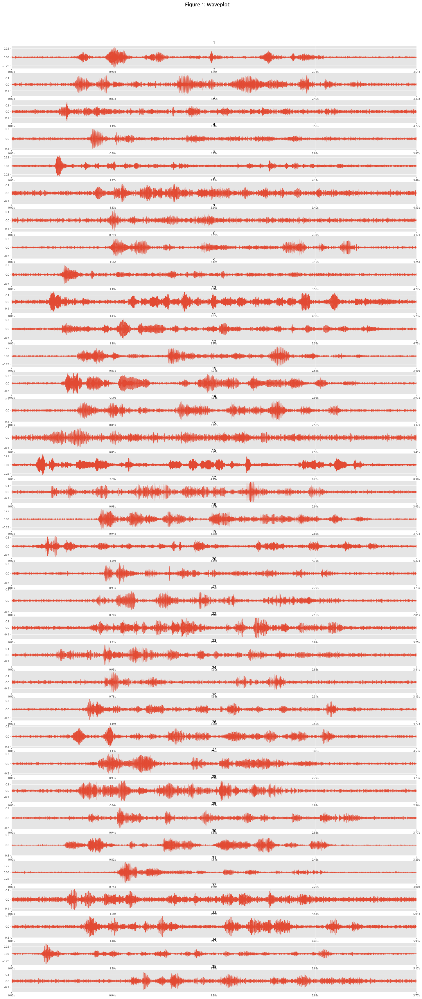

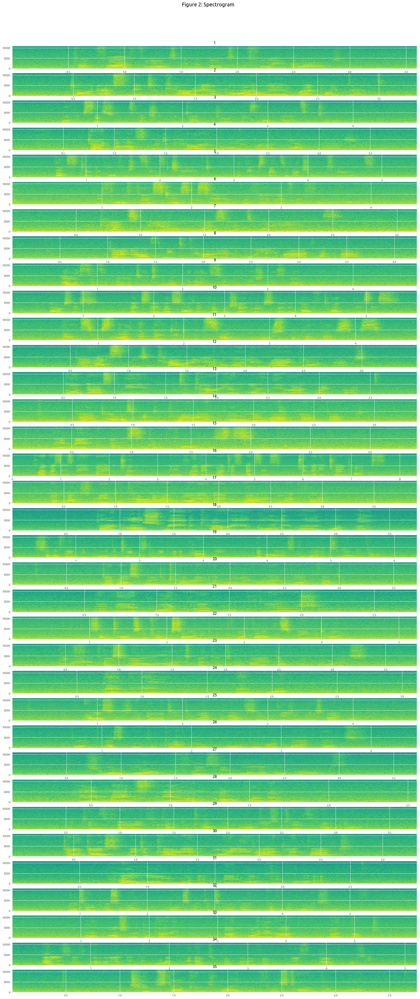

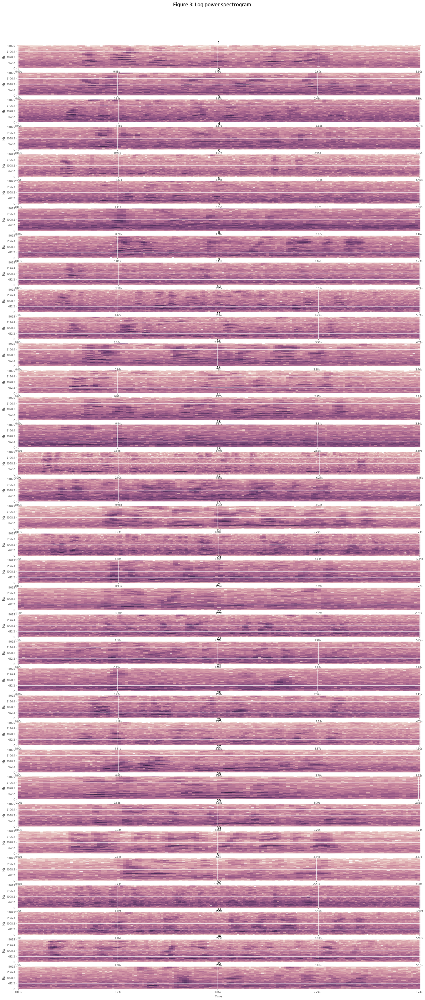

In [20]:
##Just Platting some Graphs to Visually  see How Analog signal After  getting Digitally Converted Look like 
#across different dimension
plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)


In [21]:
def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dirs,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, path in enumerate(parent_dir):
        for fn in glob.glob(os.path.join(str(path), sub_dirs, file_ext)):
            try:
                mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
                ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
                features = np.vstack([features,ext_features])
                labels = np.append(labels,path)
            except:
                continue
    return np.array(features), np.array(labels, dtype = np.int)



In [25]:
a=os.listdir(os.getcwd()+ '/1/audio')
os.chdir(os.getcwd()+ '/1/audio')

In [48]:
b,c,d,e,f=extract_feature(a[1])


In [52]:
tt=0
for i in [b,c,d,e,f]:
    print(i.shape)
    tt+=i.shape[0]
print('Features:'+str(tt))


(40,)
(12,)
(128,)
(7,)
(6,)
Features:193


In [56]:
librosa.load(a[2])[0].shape[0]

75852

In [37]:
#extract_feature(glob.glob(os.path.join('1','audio','*.wav'))[2]())
parent_dir=np.arange(1,36,1)
sub_dirs='audio'
file_ext='*.wav'

In [38]:
features,labels=parse_audio_files(parent_dir,sub_dirs,file_ext)

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.cross_validation import train_test_split
from sklearn import metrics
from sklearn.cross_validation import cross_val_score

In [44]:
# evaluate the model by splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3, random_state=0)
model2 = LogisticRegression()
model2.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [45]:
# predict class labels for the test set
predicted = model2.predict(X_test)
print predicted

[ 1  6 28  5 30 19 20 12 10 26 34  7 23 14 10 14 14 32 22 24 25 28  4 11 16
  3  2  9  8 18  8  7  6 12  6 11 22 20  8  3 29 18 20 35 30 11 11 21 18 12
 14 35 34  1  7 21 16 27  8  6 26 34  6 25  3 11  4 13 22  7 27 24 31  3 14
 31  5 29 29 18 23 21 29  3 27 35  4 23  7 13  2 23 32 29 26  2 17 13 28 22
 35  3 31 28 31]


In [46]:
probs = model2.predict_proba(X_test)
print probs

[[  9.21388220e-01   7.26179782e-05   3.99686560e-06 ...,   2.78799587e-05
    2.25508741e-04   8.21148060e-04]
 [  9.86267145e-04   3.75610054e-06   3.62539510e-02 ...,   1.22435431e-04
    9.26138445e-05   1.02212546e-04]
 [  1.37308271e-05   8.69859835e-07   2.85747880e-02 ...,   7.32623516e-02
    1.01359881e-04   4.52908532e-06]
 ..., 
 [  5.27385589e-06   1.02140418e-06   2.05510803e-04 ...,   1.82510302e-05
    4.13143123e-04   2.74858765e-08]
 [  9.63269670e-03   1.39103571e-06   1.00597464e-03 ...,   6.14738255e-04
    1.05341994e-06   2.46914162e-08]
 [  4.39502351e-06   8.36172214e-06   3.07358285e-07 ...,   6.33430378e-06
    5.68553885e-03   1.15365919e-08]]


In [47]:
print metrics.accuracy_score(y_test, predicted)


0.933333333333


In [51]:
# evaluate the model using 10-fold cross-validation

scores = cross_val_score(LogisticRegression(), features, labels, scoring='accuracy', cv=10,n_jobs=-1)
print scores
print scores.mean()

[ 0.91428571  0.88571429  0.91428571  0.94285714  0.94285714  0.94285714
  1.          0.97142857  0.94285714  1.        ]
0.945714285714
